# House Pricing - Case Study

*Author: Minh Nguyen*

## Loading Dataset and Init Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

In [2]:
def display_corr_heatmap(df, annotation = True):
    plt.figure(figsize=(20,12))
    corr = df.corr()

    corr = corr.dropna(axis=1, thresh=len(corr)*0.1)
    corr = corr.dropna(axis=0, thresh=len(corr.columns)*0.1)

    # Create a mask
    mask = np.triu(np.ones_like(corr, dtype=bool))

    sns.heatmap(corr, annot=annotation, mask=mask,
                fmt='.2f', square=True, cmap="YlGnBu", vmin=-0.5,
                vmax=1, cbar=False, annot_kws={"fontsize": 12, "color": "black"})

    plt.title('Correlation Heatmap', fontsize=16)
    plt.xticks(rotation=45, fontsize=12)
    plt.yticks(fontsize=12)
    plt.show()

In [3]:
# Load dataset from local
df = pd.read_csv("train.csv")
df.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2008,WD,Normal,118000


## Data Exploration

### Data Overview

In [4]:
df.shape

(1460, 81)

- We have 1460 records with 81 feature columns

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [6]:
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [7]:
# Display the overview of dataset
print(f"Total Rows: {df.shape[0]} records - Total Columns: {df.shape[1]} columns")

Total Rows: 1460 records - Total Columns: 81 columns


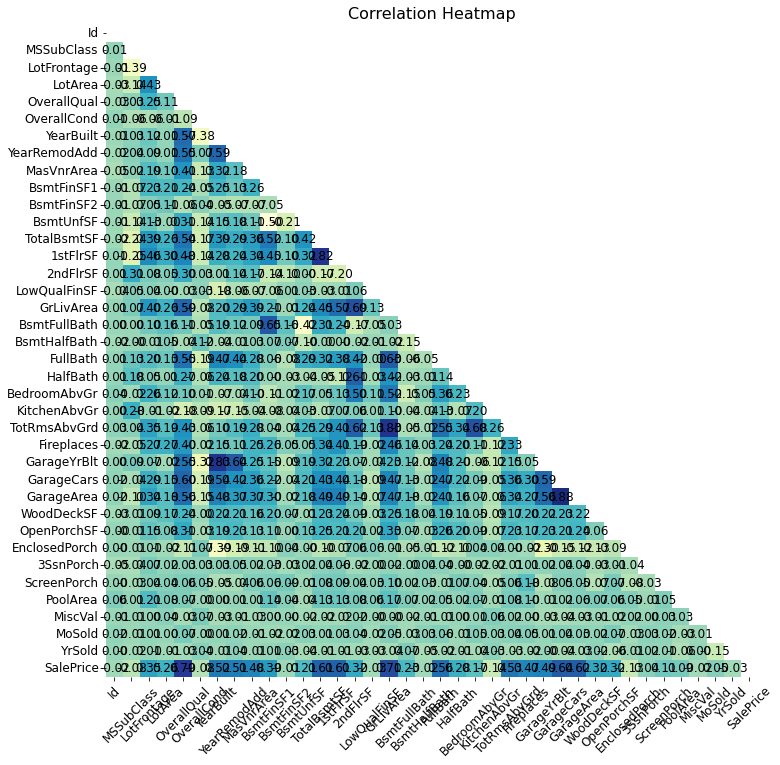

In [8]:
display_corr_heatmap(df)

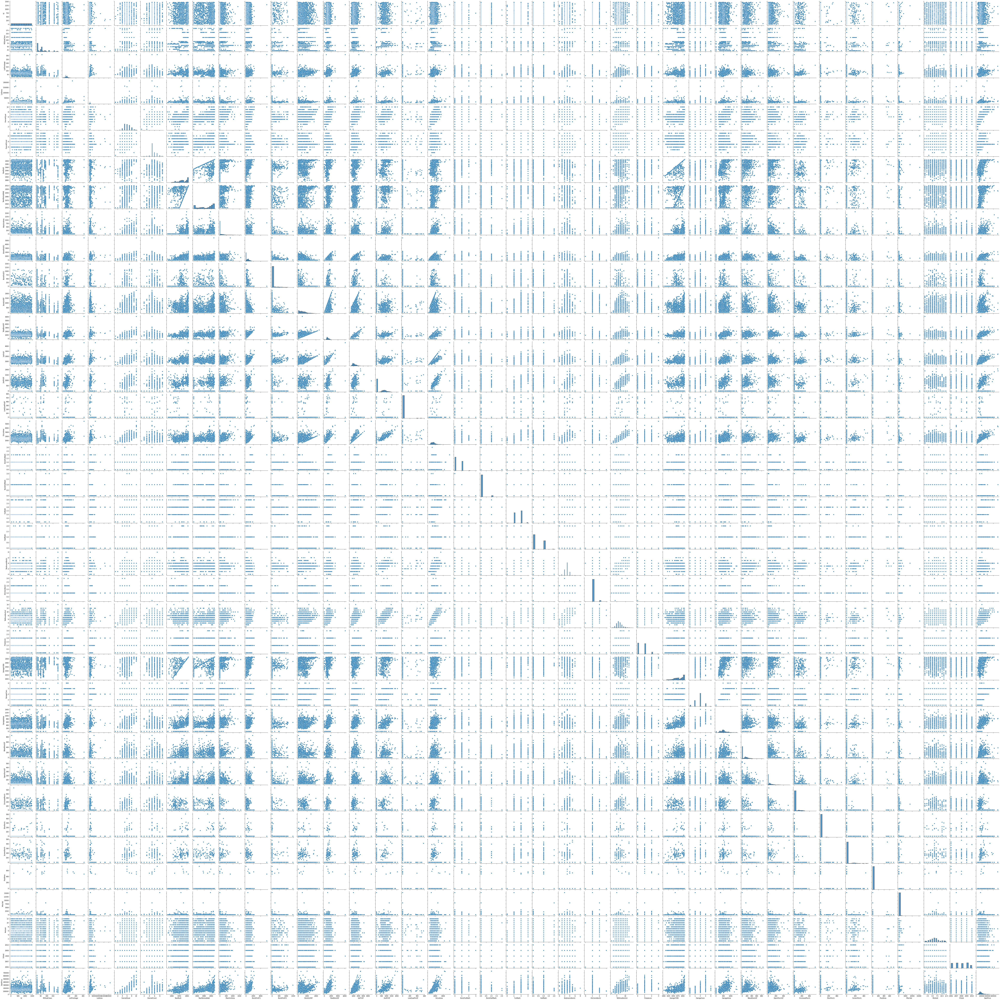

In [9]:
# Quickly check the correlation between all columns with other columns
# it take 4minutes so we will comment them before feature engineering
sns.pairplot(df)
plt.show()

## Data Cleaning

### Summary
<li> Drop some columns that not necessary </li>
<li> Drop Duplicates records </li>
<li> Remove rows with null values > 40% </li>
<li> Drop columns that has null value > 40% </li>
<li> Drop columns that only has 1 value </li>

- There are some columns that not necessary in the dataset.
    -  The instant column: Alternative of Index column
    - The casual column and registered column: Sub columns of target column (cnt)
    - The dtedate column: Unique value and similar like index column

In [10]:
df_filter = df.drop_duplicates(keep="first")
df_filter

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


In [11]:
# Remove rows with total null features > 80% and drop columns that has total null records > 80%
df_filter = df_filter.dropna(axis=1, thresh=len(df_filter)*0.2)
df_filter = df_filter.dropna(axis=0, thresh=len(df_filter.columns)*0.2)
df_filter

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,...,0,0,0,0,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,...,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,...,0,0,0,0,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,Reg,Lvl,AllPub,Inside,...,112,0,0,0,0,4,2010,WD,Normal,142125


<b>Display all columns that has null value</b>

In [12]:
cols_remove = []
columns_left = df_filter.columns[df_filter.isnull().sum() > 0]
print(columns_left)
for column in columns_left:
    print("*"*100)
    print(f"Column name: {column}\n")
    print(f"Total Num: {df_filter[column].isnull().sum()} - Ratio: {round(df_filter[column].isnull().sum() * 100/len(df_filter))}%\n")
    print(f"Total Distinct Value: {len(pd.unique(df_filter[column]))}")
    print(df_filter[column].value_counts())
    if len(df_filter[column].value_counts()) == 1:
        cols_remove += [column]
    
# Drop columns that only has 1 value
df_filter = df_filter.drop(columns = cols_remove)

Index(['LotFrontage', 'MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Electrical',
       'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish',
       'GarageQual', 'GarageCond'],
      dtype='object')
****************************************************************************************************
Column name: LotFrontage

Total Num: 259 - Ratio: 18%

Total Distinct Value: 111
60.0     143
70.0      70
80.0      69
50.0      57
75.0      53
        ... 
137.0      1
141.0      1
38.0       1
140.0      1
46.0       1
Name: LotFrontage, Length: 110, dtype: int64
****************************************************************************************************
Column name: MasVnrType

Total Num: 8 - Ratio: 1%

Total Distinct Value: 5
None       864
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64
***********************************************************************************************

In [13]:
df_filter.shape

(1460, 77)

## EDA

### Summary
Based on the EDA part, we have some insights.
<li> People frequently rent bikes in good condition in nice weather.</li> 
<li> Throughout the summer and fall, the demand for bike rentals increases.</li> 
<li> There is no statistically significant variation in the overall number of bicycles between weekdays </li>

### Visualize the data correlation

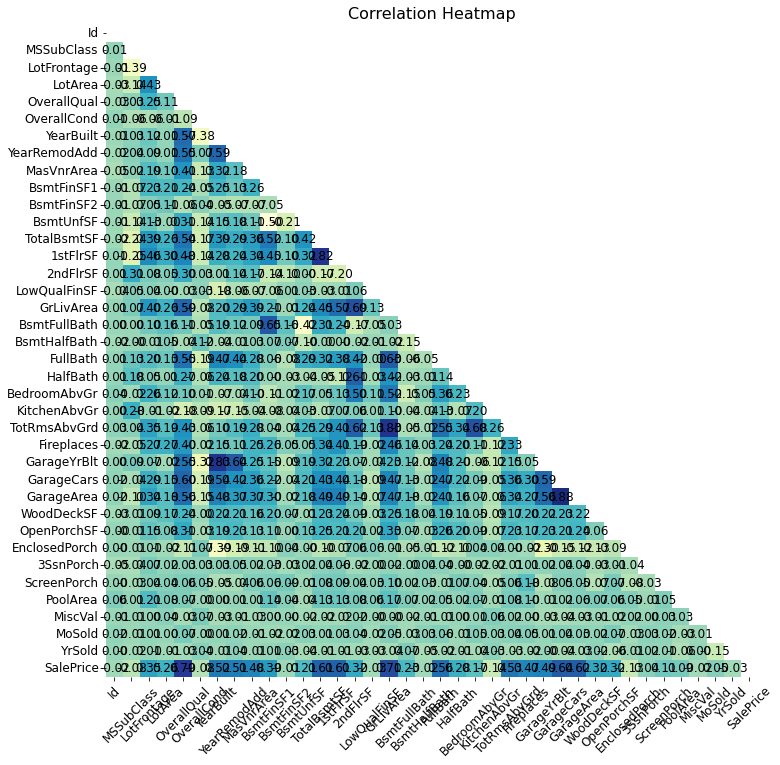

In [14]:
display_corr_heatmap(df_filter)

- There are highly correlated between columns, so it maybe cause the multicollinear when training the model

<b> Do some categorize convert to verify if there category has correlation with the target columns

In [15]:
from sklearn.preprocessing import LabelEncoder

# create label encoder object
le = LabelEncoder()

# apply label encoder to category column
# df['category_column_encoded'] = le.fit_transform(df['category_column'])

for col in list(df_filter.select_dtypes(include=['object']).columns):
    print(col)
    df_filter[col + "_encoded"] = le.fit_transform(df_filter[col])

MSZoning
Street
LotShape
LandContour
Utilities
LotConfig
LandSlope
Neighborhood
Condition1
Condition2
BldgType
HouseStyle
RoofStyle
RoofMatl
Exterior1st
Exterior2nd
MasVnrType
ExterQual
ExterCond
Foundation
BsmtQual
BsmtCond
BsmtExposure
BsmtFinType1
BsmtFinType2
Heating
HeatingQC
CentralAir
Electrical
KitchenQual
Functional
FireplaceQu
GarageType
GarageFinish
GarageQual
GarageCond
PavedDrive
SaleType
SaleCondition


<b>Use only top correlated features with the Sale Prie columns for analyzing 

In [16]:
# Only Focus on the loan status column correlation
df_loan_corr = pd.DataFrame(df_filter.corrwith(df_filter['SalePrice']), columns=["corr"]).sort_values(by = ["corr"], ascending=False).dropna()

# Top 5 top and bottom correlation features
list_to_analyze = list(set(df_loan_corr.head(10).append(df_loan_corr.tail(5)).index.tolist()) - {"SalePrice"})
print(list_to_analyze)
df_loan_corr.head(20)

['FullBath', 'TotRmsAbvGrd', '1stFlrSF', 'YearBuilt', 'GarageArea', 'BsmtQual_encoded', 'FireplaceQu_encoded', 'KitchenQual_encoded', 'GrLivArea', 'OverallQual', 'GarageCars', 'GarageFinish_encoded', 'TotalBsmtSF', 'ExterQual_encoded']


,corr
SalePrice,1.000000
OverallQual,0.790982
GrLivArea,0.708624
GarageCars,0.640409
GarageArea,0.623431
TotalBsmtSF,0.613581
1stFlrSF,0.605852
FullBath,0.560664
TotRmsAbvGrd,0.533723
YearBuilt,0.522897


In [17]:
# # Only Focus on the loan status column correlation
# df_loan_corr = pd.DataFrame(df_filter.corrwith(df_filter['SalePrice']), columns=["corr"]).sort_values(by = ["corr"], ascending=False).dropna()

# # Top 5 top and bottom correlation features
# list_to_analyze = list(set(df_loan_corr.head(10).append(df_loan_corr.tail(10)).index.tolist()) - {"SalePrice"})
# print(list_to_analyze)
# df_loan_corr.head(20)

In [18]:
list_to_analyze

['FullBath',
 'TotRmsAbvGrd',
 '1stFlrSF',
 'YearBuilt',
 'GarageArea',
 'BsmtQual_encoded',
 'FireplaceQu_encoded',
 'KitchenQual_encoded',
 'GrLivArea',
 'OverallQual',
 'GarageCars',
 'GarageFinish_encoded',
 'TotalBsmtSF',
 'ExterQual_encoded']

In [19]:
for feature in list_to_analyze:
    print("=" * 20)
    print(f"Feature: {feature}")
    print(df_filter[feature].head(5))

Feature: FullBath
0    2
1    2
2    2
3    1
4    2
Name: FullBath, dtype: int64
Feature: TotRmsAbvGrd
0    8
1    6
2    6
3    7
4    9
Name: TotRmsAbvGrd, dtype: int64
Feature: 1stFlrSF
0     856
1    1262
2     920
3     961
4    1145
Name: 1stFlrSF, dtype: int64
Feature: YearBuilt
0    2003
1    1976
2    2001
3    1915
4    2000
Name: YearBuilt, dtype: int64
Feature: GarageArea
0    548
1    460
2    608
3    642
4    836
Name: GarageArea, dtype: int64
Feature: BsmtQual_encoded
0    2
1    2
2    2
3    3
4    2
Name: BsmtQual_encoded, dtype: int64
Feature: FireplaceQu_encoded
0    5
1    4
2    4
3    2
4    4
Name: FireplaceQu_encoded, dtype: int64
Feature: KitchenQual_encoded
0    2
1    3
2    2
3    2
4    2
Name: KitchenQual_encoded, dtype: int64
Feature: GrLivArea
0    1710
1    1262
2    1786
3    1717
4    2198
Name: GrLivArea, dtype: int64
Feature: OverallQual
0    7
1    6
2    7
3    7
4    8
Name: OverallQual, dtype: int64
Feature: GarageCars
0    2
1    2
2    2
3 

### Visualize the continuous features

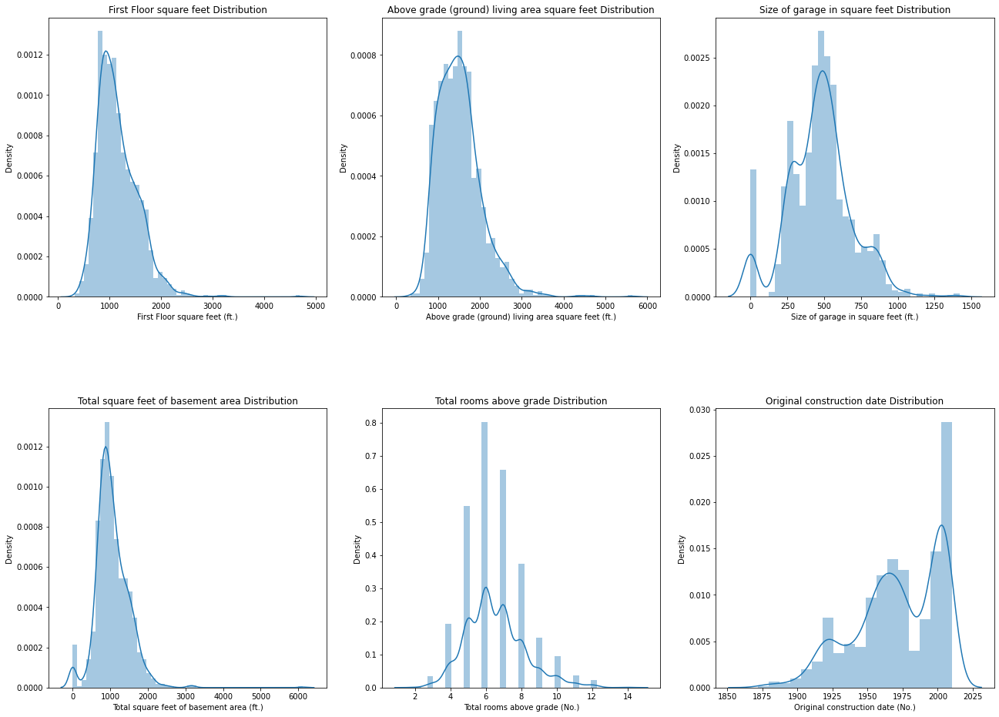

In [20]:
plt.figure(figsize=(22,16))

plt.subplot(2,3,1)
sns.distplot(df_filter["1stFlrSF"])
plt.title("First Floor square feet Distribution")
plt.xlabel("First Floor square feet (ft.)")

plt.subplot(2,3,2)
sns.distplot(df_filter["GrLivArea"])
plt.title("Above grade (ground) living area square feet Distribution")
plt.xlabel("Above grade (ground) living area square feet (ft.)")

plt.subplot(2,3,3)
sns.distplot(df_filter["GarageArea"])
plt.title("Size of garage in square feet Distribution")
plt.xlabel("Size of garage in square feet (ft.)")

plt.subplot(2,3,4)
sns.distplot(df_filter["TotalBsmtSF"])
plt.title("Total square feet of basement area Distribution")
plt.xlabel("Total square feet of basement area (ft.)")


plt.subplot(2,3,5)
sns.distplot(df_filter["TotRmsAbvGrd"])
plt.title("Total rooms above grade Distribution")
plt.xlabel("Total rooms above grade (No.)")

plt.subplot(2,3,6)
sns.distplot(df_filter["YearBuilt"])
plt.title("Original construction date Distribution")
plt.xlabel("Original construction date (No.)")

plt.subplots_adjust(hspace=0.4)
plt.show()


### Visualize the categorical features

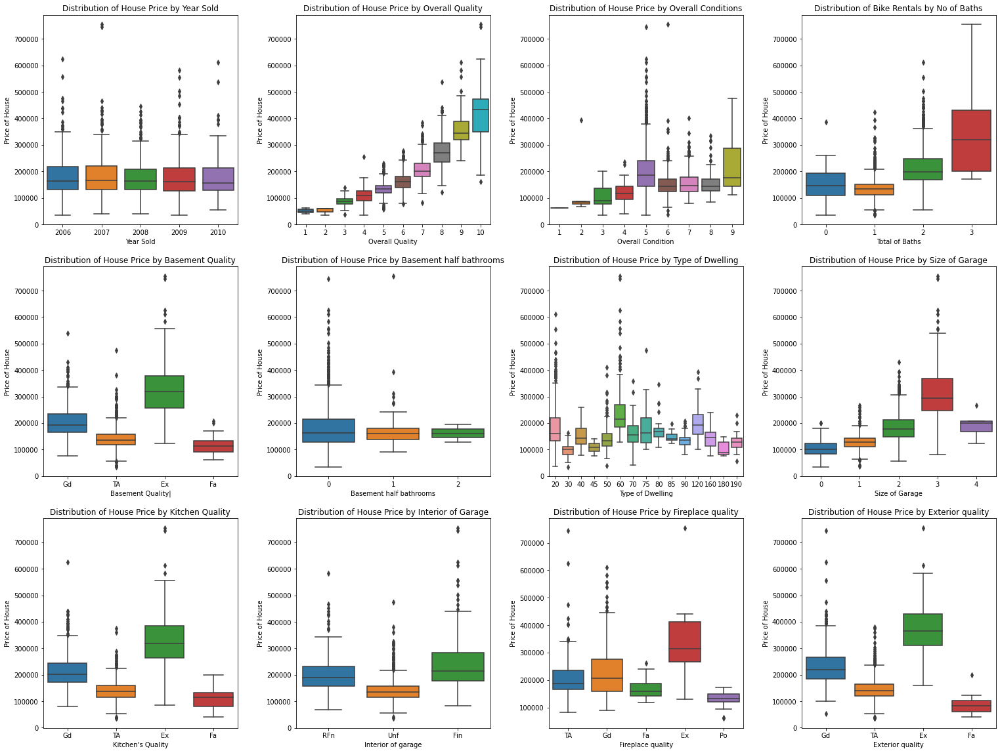

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(26,20))

plt.subplot(3,4,1)
sns.boxplot(x="YrSold", y="SalePrice", data=df_filter)
plt.title("Distribution of House Price by Year Sold")
plt.xlabel("Year Sold")
plt.ylabel("Price of House")

plt.subplot(3,4,2)
sns.boxplot(x="OverallQual", y="SalePrice", data=df_filter)
plt.title("Distribution of House Price by Overall Quality")
plt.xlabel("Overall Quality")
plt.ylabel("Price of House")

plt.subplot(3,4,3)
sns.boxplot(x="OverallCond", y="SalePrice", data=df_filter)
plt.title("Distribution of House Price by Overall Conditions")
plt.xlabel("Overall Condition")
plt.ylabel("Price of House")

plt.subplot(3,4,4)
sns.boxplot(x="FullBath", y="SalePrice", data=df_filter)
plt.title("Distribution of Bike Rentals by No of Baths")
plt.xlabel("Total of Baths")
plt.ylabel("Price of House")

plt.subplot(3,4,5)
sns.boxplot(x="BsmtQual", y="SalePrice", data=df_filter)
plt.title("Distribution of House Price by Basement Quality")
plt.xlabel("Basement Quality|")
plt.ylabel("Price of House")

plt.subplot(3,4,6)
sns.boxplot(x="BsmtHalfBath", y="SalePrice", data=df_filter)
plt.title("Distribution of House Price by Basement half bathrooms")
plt.xlabel("Basement half bathrooms")
plt.ylabel("Price of House")

plt.subplot(3,4,7)
sns.boxplot(x="MSSubClass", y="SalePrice", data=df_filter)
plt.title("Distribution of House Price by Type of Dwelling")
plt.xlabel("Type of Dwelling")
plt.ylabel("Price of House")

plt.subplot(3,4,8)
sns.boxplot(x="GarageCars", y="SalePrice", data=df_filter)
plt.title("Distribution of House Price by Size of Garage")
plt.xlabel("Size of Garage")
plt.ylabel("Price of House")

plt.subplot(3,4,9)
sns.boxplot(x="KitchenQual", y="SalePrice", data=df_filter)
plt.title("Distribution of House Price by Kitchen Quality")
plt.xlabel("Kitchen's Quality")
plt.ylabel("Price of House")

plt.subplot(3,4,10)
sns.boxplot(x="GarageFinish", y="SalePrice", data=df_filter)
plt.title("Distribution of House Price by Interior of Garage")
plt.xlabel("Interior of garage")
plt.ylabel("Price of House")

plt.subplot(3,4,11)
sns.boxplot(x="FireplaceQu", y="SalePrice", data=df_filter)
plt.title("Distribution of House Price by Fireplace quality")
plt.xlabel("Fireplace quality")
plt.ylabel("Price of House")

plt.subplot(3,4,12)
sns.boxplot(x="ExterQual", y="SalePrice", data=df_filter)
plt.title("Distribution of House Price by Exterior quality")
plt.xlabel("Exterior quality")
plt.ylabel("Price of House")


plt.subplots_adjust(wspace=0.3)
plt.show()


- The house's price usually high based on conditions and size of attributes 
- Some features has abnormal behaviors / or it reflect the people's behaviors
    - Most of outlier exists with overall condition = 5
    - The house's price is higher with size of garage = 3 and type of dwelling = 60 (even they are not highest)
<br>
<b> ==> It's not reflect that those features are main aspects that impacts the house price because there are the combined features, not only one feature

## Model Training and Validation

In [22]:
ordinal_col = ["ExterQual", "ExterCond", "BsmtQual", "BsmtCond", 
               "BsmtExposure", "BsmtFinType1", "BsmtFinType2", "HeatingQC", 
               "KitchenQual", "FireplaceQu", "GarageQual", "GarageCond", "PoolQC"]
cardinal_col = []
for col in list(df_filter.select_dtypes(include=['object']).columns):
    if col not in ordinal_col and col not in cardinal_col:
        cardinal_col += [col]

In [23]:
cardinal_col

['MSZoning',
 'Street',
 'LotShape',
 'LandContour',
 'Utilities',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'Foundation',
 'Heating',
 'CentralAir',
 'Electrical',
 'Functional',
 'GarageType',
 'GarageFinish',
 'PavedDrive',
 'SaleType',
 'SaleCondition']

- Ordinal Columns:
    + ExterQual
    + ExterCond
    + BsmtQual
    + BsmtCond
    + BsmtExposure
    + BsmtFinType1
    + BsmtFinType2
    + HeatingQC
    + KitchenQual
    + FireplaceQu
    + GarageQual
    + GarageCond
    + PoolQC

In [24]:
remove_col = []
for col in list(df_filter.columns):
    if "encod" in col:
        remove_col += [col]
        
df_filter = df_filter.drop(remove_col, axis = 1)

In [25]:
ExterQual_map = {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1}
ExterCond_map = {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1}
BsmtQual_map = {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "NA": 0}
BsmtCond_map = {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "NA": 0}
BsmtExposure_map = {"Gd": 4, "Av": 3, "Mn": 2, "No": 1, "NA": 0}
BsmtFinType1_map = {"GLQ": 6, "ALQ": 5, "BLQ": 4, "Rec": 3, "LwQ": 2, "Unf": 1, "NA": 0}
BsmtFinType2_map = {"GLQ": 6, "ALQ": 5, "BLQ": 4, "Rec": 3, "LwQ": 2, "Unf": 1, "NA": 0}
HeatingQC_map = {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1}
KitchenQual_map = {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1}
FireplaceQu_map = {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "NA": 0}
GarageQual_map = {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "NA": 0}
GarageCond_map = {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "NA": 0}
PoolQC_map = {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "NA": 1}

df_filter = df_filter.replace(
                    {
                        "ExterQual": ExterQual_map,
                        "ExterCond": ExterCond_map,
                        "BsmtQual": BsmtQual_map,
                        "BsmtCond": BsmtCond_map,
                        "BsmtExposure": BsmtExposure_map,
                        "BsmtFinType1": BsmtFinType1_map,
                        "BsmtFinType2": BsmtFinType2_map,
                        "HeatingQC": HeatingQC_map,
                        "KitchenQual": KitchenQual_map,
                        "FireplaceQu": FireplaceQu_map,
                        "GarageQual": GarageQual_map,
                        "GarageCond": GarageCond_map,
                        "PoolQC": PoolQC_map
                    }
                )
df_filter["ExterQual"]

0       4
1       3
2       4
3       3
4       4
       ..
1455    3
1456    3
1457    5
1458    3
1459    4
Name: ExterQual, Length: 1460, dtype: int64

### Data Initilization

In [26]:
# Because the weather situation and season are categorical       columns so we will convert to dummy columns before training
df_dummy = pd.get_dummies(df_filter[cardinal_col].astype('category'), drop_first=True)
df_dummy

,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0,0,1,0,1,0,0,1,0,0,...,0,0,0,0,1,0,0,0,1,0
1,0,0,1,0,1,0,0,1,0,0,...,0,0,0,0,1,0,0,0,1,0
2,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
3,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,0,0,1,0,1,0,0,1,0,0,...,0,0,0,0,1,0,0,0,1,0
1456,0,0,1,0,1,0,0,1,0,0,...,0,0,0,0,1,0,0,0,1,0
1457,0,0,1,0,1,0,0,1,0,0,...,0,0,0,0,1,0,0,0,1,0
1458,0,0,1,0,1,0,0,1,0,0,...,0,0,0,0,1,0,0,0,1,0


In [27]:
df_final = pd.concat([df_filter.drop(columns = cardinal_col, axis=1), df_dummy], axis=1)
df_final

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,1,60,65.0,8450,7,5,2003,2003,196.0,4,...,0,0,0,0,1,0,0,0,1,0
1,2,20,80.0,9600,6,8,1976,1976,0.0,3,...,0,0,0,0,1,0,0,0,1,0
2,3,60,68.0,11250,7,5,2001,2002,162.0,4,...,0,0,0,0,1,0,0,0,1,0
3,4,70,60.0,9550,7,5,1915,1970,0.0,3,...,0,0,0,0,1,0,0,0,0,0
4,5,60,84.0,14260,8,5,2000,2000,350.0,4,...,0,0,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,62.0,7917,6,5,1999,2000,0.0,3,...,0,0,0,0,1,0,0,0,1,0
1456,1457,20,85.0,13175,6,6,1978,1988,119.0,3,...,0,0,0,0,1,0,0,0,1,0
1457,1458,70,66.0,9042,7,9,1941,2006,0.0,5,...,0,0,0,0,1,0,0,0,1,0
1458,1459,20,68.0,9717,5,6,1950,1996,0.0,3,...,0,0,0,0,1,0,0,0,1,0


In [43]:
df_final["LotFrontage"] = df_final["LotFrontage"].fillna(df_final["LotFrontage"].mean())
df_final["MasVnrArea"] = df_final["MasVnrArea"].fillna(df_final["MasVnrArea"].mean())
df_final["BsmtQual"] = df_final["BsmtQual"].fillna(-1)
df_final["BsmtCond"] = df_final["BsmtCond"].fillna(-1)
df_final["BsmtExposure"] = df_final["BsmtExposure"].fillna(-1)
df_final["BsmtFinType1"] = df_final["BsmtFinType1"].fillna(-1)
df_final["BsmtFinType2"] = df_final["BsmtFinType2"].fillna(-1)
df_final["FireplaceQu"] = df_final["FireplaceQu"].fillna(-1)
df_final["GarageYrBlt"] = df_final["GarageYrBlt"].fillna(df_final["GarageYrBlt"].mean())
df_final["GarageQual"] = df_final["GarageQual"].fillna(-1)
df_final["GarageCond"] = df_final["GarageCond"].fillna(-1)

In [28]:
scale_cols = []
for col in list(df_filter.columns):
    if col not in ordinal_col and col not in cardinal_col and col != "Id" and col != "SalePrice": 
        scale_cols += [col]

#### Prepare Dataset

In [44]:
# Splitting dataset
from sklearn.model_selection import train_test_split
df_train, df_test = train_test_split(df_final, train_size=0.7, random_state=1)
print(df_train.shape)
print(df_test.shape)

(1021, 205)
(439, 205)


In [45]:
# Import the MinMaxScaler()
from sklearn.preprocessing import MinMaxScaler

# Create a scaling object
scaler = MinMaxScaler()

# Create a list of the variables that you need to scale
varlist = scale_cols

# Scale these variables using 'fit_transform'
df_train[varlist] = scaler.fit_transform(df_train[varlist])

df_train

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
208,209,0.235294,0.167979,0.061062,0.666667,0.428571,0.840580,0.650000,0.080000,4,...,0,0,0,0,1,0,0,0,1,0
83,84,0.000000,0.202055,0.035486,0.444444,0.428571,0.637681,0.166667,0.041250,3,...,0,0,0,0,0,0,0,0,1,0
1174,1175,0.294118,0.202055,0.071327,0.555556,0.857143,0.434783,0.000000,0.000000,3,...,0,0,0,0,1,0,0,0,1,0
250,251,0.058824,0.116438,0.018930,0.222222,0.000000,0.492754,0.266667,0.000000,3,...,0,0,0,0,1,0,0,0,1,0
895,896,0.235294,0.171233,0.026904,0.555556,0.428571,0.659420,0.216667,0.259375,3,...,0,0,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,716,0.000000,0.195205,0.041319,0.555556,0.428571,0.739130,0.400000,0.108750,3,...,0,0,0,0,1,0,0,0,1,0
905,906,0.000000,0.202055,0.040291,0.444444,0.428571,0.594203,0.066667,0.068750,3,...,0,0,0,0,1,0,0,0,1,0
1096,1097,0.294118,0.133562,0.026091,0.555556,0.714286,0.304348,0.933333,0.000000,3,...,0,0,0,0,1,0,0,0,1,0
235,236,0.823529,0.000000,0.001776,0.555556,0.142857,0.717391,0.350000,0.377500,3,...,0,0,0,0,1,0,0,0,1,0


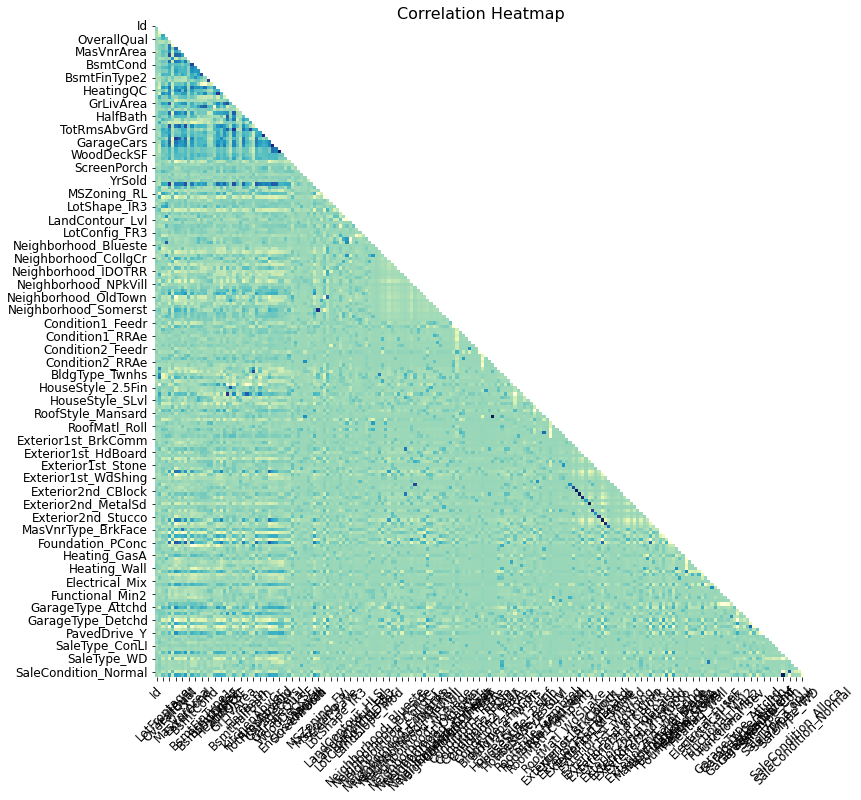

In [46]:
display_corr_heatmap(df_train,annotation = False)

In [47]:
# Split the train dataset into X and y
y_train = df_train.pop('SalePrice')
X_train = df_train.drop(columns = ["Id"])

In [48]:
null_cols = df_train.columns[df_train.isnull().any()].tolist()
null_cols

[]

### Features Selection with VIF

In [49]:
lm = LinearRegression()
lm.fit(X_train, y_train)
rfe = RFE(lm)
rfe = rfe.fit(X_train, y_train)

In [50]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('MSSubClass', True, 1),
 ('LotFrontage', True, 1),
 ('LotArea', True, 1),
 ('OverallQual', True, 1),
 ('OverallCond', True, 1),
 ('YearBuilt', True, 1),
 ('YearRemodAdd', False, 75),
 ('MasVnrArea', True, 1),
 ('ExterQual', True, 1),
 ('ExterCond', False, 55),
 ('BsmtQual', False, 81),
 ('BsmtCond', False, 57),
 ('BsmtExposure', True, 1),
 ('BsmtFinType1', False, 103),
 ('BsmtFinSF1', True, 1),
 ('BsmtFinType2', False, 74),
 ('BsmtFinSF2', True, 1),
 ('BsmtUnfSF', True, 1),
 ('TotalBsmtSF', True, 1),
 ('HeatingQC', False, 87),
 ('1stFlrSF', True, 1),
 ('2ndFlrSF', True, 1),
 ('LowQualFinSF', True, 1),
 ('GrLivArea', True, 1),
 ('BsmtFullBath', False, 70),
 ('BsmtHalfBath', False, 9),
 ('FullBath', False, 37),
 ('HalfBath', False, 33),
 ('BedroomAbvGr', True, 1),
 ('KitchenAbvGr', True, 1),
 ('KitchenQual', True, 1),
 ('TotRmsAbvGrd', False, 17),
 ('Fireplaces', True, 1),
 ('FireplaceQu', False, 95),
 ('GarageYrBlt', False, 88),
 ('GarageCars', False, 2),
 ('GarageArea', True, 1),
 ('

In [51]:
X_train.columns[~rfe.support_]

Index(['YearRemodAdd', 'ExterCond', 'BsmtQual', 'BsmtCond', 'BsmtFinType1',
       'BsmtFinType2', 'HeatingQC', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       ...
       'GarageFinish_RFn', 'GarageFinish_Unf', 'PavedDrive_Y', 'SaleType_CWD',
       'SaleType_ConLD', 'SaleType_ConLI', 'SaleType_WD',
       'SaleCondition_AdjLand', 'SaleCondition_Family',
       'SaleCondition_Partial'],
      dtype='object', length=102)

In [52]:
col = X_train.columns[rfe.support_]
X_train_rfe = X_train[col]

In [53]:
import statsmodels.api as sm
X_train_rfe = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.914
Model:                            OLS   Adj. R-squared:                  0.906
Method:                 Least Squares   F-statistic:                     105.2
Date:                Wed, 03 May 2023   Prob (F-statistic):               0.00
Time:                        10:13:57   Log-Likelihood:                -11683.
No. Observations:                1021   AIC:                         2.356e+04
Df Residuals:                     926   BIC:                         2.403e+04
Df Model:                          94                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -6.438e+05 

,Features,VIF
11,BsmtFinSF2,inf
12,BsmtUnfSF,inf
57,Condition2_RRAe,inf
66,RoofStyle_Shed,inf
79,Exterior2nd_CBlock,inf
...,...,...
35,LotConfig_FR3,1.06
96,SaleType_Con,1.04
58,Condition2_RRAn,NaN
69,RoofMatl_Metal,NaN


- Based on the P-value
    + Drop the HouseStyle_2.5Fin column first (P = 0.813)
    + Drop the Exterior2nd_CBlock, Exterior1st_CBlock column (P = 0.781)

In [54]:
X_train_new = X_train_rfe.drop(["HouseStyle_2.5Fin", "Exterior2nd_CBlock", 
                                "Exterior1st_CBlock", "LowQualFinSF", 
                                "Condition2_RRAn", "Exterior1st_AsphShn",
                                "Condition2_RRNn", "SaleType_ConLw",
                                "3SsnPorch", "Neighborhood_MeadowV", 
                                "GarageType_Attchd", "RoofMatl_Metal",
                                "GarageType_Basment", "BsmtFinSF2", 
                                "HouseStyle_2.5Unf", "KitchenAbvGr",
                                "LotShape_IR3", "Exterior1st_BrkComm",
                                "Functional_Maj2", "Foundation_Wood",
                                "LotFrontage", "Condition2_RRAe", "RoofStyle_Shed",
                                "Condition2_Norm", "LotConfig_FR3",
                                "Condition2_Feedr", "GrLivArea", 
                                "RoofMatl_CompShg", "TotalBsmtSF",
                                "YearBuilt", "Foundation_PConc",
                                "1stFlrSF", "LandContour_Low", "RoofMatl_Roll",
                                "Functional_Typ", "BldgType_Duplex", "RoofMatl_Tar&Grv", 
                                "Foundation_CBlock"], 
                               axis = 1)

X_train_lm = sm.add_constant(X_train_new)
lm = sm.OLS(y_train, X_train_lm).fit()
print(lm.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_lm.columns
vif['VIF'] = [variance_inflation_factor(X_train_lm.values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.862
Model:                            OLS   Adj. R-squared:                  0.852
Method:                 Least Squares   F-statistic:                     94.54
Date:                Wed, 03 May 2023   Prob (F-statistic):               0.00
Time:                        10:14:02   Log-Likelihood:                -11928.
No. Observations:                1021   AIC:                         2.398e+04
Df Residuals:                     957   BIC:                         2.430e+04
Df Model:                          63                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -6.643e+04 

,Features,VIF
0,const,162.65
49,Exterior1st_Wd Sdng,4.24
51,Exterior2nd_Wd Sdng,4.17
3,OverallQual,3.68
1,MSSubClass,3.34
...,...,...
46,RoofMatl_WdShake,1.07
18,MoSold,1.07
55,Functional_Sev,1.06
61,SaleType_Oth,1.05


- The VIF and p-values appear to be normal.
- Even after reducing the features from 14 to 11, the Adjusted R-squared score remains at 0.81.
- This model explains the majority of the variance without being overly complicated.
- The model evaluation will coming next.

### Linear Regression

In [57]:
features_selection = vif.Features.tolist()
features_selection.remove('const')

In [59]:
features_selection

['Exterior1st_Wd Sdng',
 'Exterior2nd_Wd Sdng',
 'OverallQual',
 'MSSubClass',
 'BsmtFinSF1',
 '2ndFlrSF',
 'ExterQual',
 'BldgType_TwnhsE',
 'BsmtUnfSF',
 'LotArea',
 'GarageArea',
 'KitchenQual',
 'SaleType_New',
 'LandSlope_Sev',
 'SaleCondition_Normal',
 'BedroomAbvGr',
 'BldgType_Twnhs',
 'GarageCond',
 'BsmtExposure',
 'LandContour_Lvl',
 'MasVnrArea',
 'Foundation_Slab',
 'Condition1_Norm',
 'LandContour_HLS',
 'Neighborhood_NAmes',
 'Fireplaces',
 'GarageType_Detchd',
 'Neighborhood_NridgHt',
 'Neighborhood_CollgCr',
 'Neighborhood_OldTown',
 'Condition1_PosN',
 'Neighborhood_NoRidge',
 'OverallCond',
 'GarageType_BuiltIn',
 'Neighborhood_Gilbert',
 'Neighborhood_Crawfor',
 'Heating_Wall',
 'Condition2_PosN',
 'Neighborhood_NWAmes',
 'OpenPorchSF',
 'Neighborhood_StoneBr',
 'RoofMatl_Membran',
 'Exterior1st_CemntBd',
 'Neighborhood_Edwards',
 'Condition1_RRAn',
 'RoofStyle_Gable',
 'LotConfig_CulDSac',
 'SaleCondition_Alloca',
 'LotShape_IR2',
 'ScreenPorch',
 'Condition1_RRAe'

In [66]:
X_train = X_train[features_selection]

# Scale these variables using 'fit_transform'
df_test[varlist] = scaler.transform(df_test[varlist])
X_test = df_test[features_selection]
y_test = df_test["SalePrice"]

In [62]:
# Instantiate
lm = LinearRegression()

# Fit a line
lm.fit(X_train, y_train)

LinearRegression()

In [63]:
# Print the coefficients and intercept
print(lm.intercept_)
print(lm.coef_)

-66432.00002465938
[ -13438.10183552   11926.50004395  117904.68730236  -31761.76216198
   87268.54597378   49739.77494735   11792.31974215   -9198.5310597
   11036.68923298  134316.90589216   75793.6322183    10015.01592838
   23743.65645957  -24473.08415735    4331.40229662   44680.6152929
  -15973.59847255   -2578.03290586    8369.15269189   18215.05546
   36503.31494982   12406.0154674    11683.07537234   20135.18194829
  -10283.16542376   27400.93469057   -5138.89659552   48987.50176239
   -4931.56101343  -12697.34179541   14141.2765973    35143.63265251
   16838.80394177    5986.1639192    -9575.24256864   30067.57431502
   24512.6048947  -156750.08624372   -8629.58969063   24136.35258903
   69715.82133815   48112.8578626    17812.74084703  -14390.64934724
   10211.59996012  -10618.31152614    8634.21391584   31102.23619252
   17090.57253106   17232.33439911  -10762.50424647  130727.89242525
   18407.61581266  -42386.04379487  -26177.25076461  -13442.18328441
   20069.40824819  -

In [74]:
from sklearn.metrics import r2_score, mean_squared_error

y_pred_train = lm.predict(X_train)
y_pred_test = lm.predict(X_test)

metric = []
r2_train_lr = r2_score(y_train, y_pred_train)
print("Training set: ", r2_train_lr)
metric.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print("Testing set: ", r2_test_lr)
metric.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print("RSS Training set: ", rss1_lr)
metric.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print("RSS Testing set: ", rss2_lr)
metric.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print("MSE Training set: ", mse_train_lr)
metric.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print("MSE Test set: ", mse_test_lr)
metric.append(mse_test_lr**0.5)

Training set:  0.8615699657904075
Testing set:  0.8202197666394248
RSS Training set:  840235495329.42
RSS Testing set:  563949321322.2593
MSE Training set:  822953472.4088346
MSE Test set:  1284622599.8229141


### Ridge and Lasso Regression

#### Ridge Regression

In [85]:
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV

params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

ridge = Ridge()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error',  
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv.fit(X_train, y_train) 
#https://scikit-learn.org/stable/modules/model_evaluation.html

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [86]:
# Printing the best hyperparameter alpha
print(model_cv.best_params_)

{'alpha': 0.8}


In [72]:
#Fitting Ridge model for alpha = 10 and printing coefficients which have been penalised
alpha = 0.8
ridge = Ridge(alpha=alpha)

ridge.fit(X_train, y_train)
print(ridge.coef_)

[-11916.16935483  10198.49953031 109893.06003127 -30477.47240652
  74655.32512369  48975.01923114  13434.97844989 -11143.81143376
  10217.53663407  76146.86686603  74149.54085393  10999.99613332
  23582.63489506  -2533.91449595   5255.89559879  45170.67290454
 -17346.34748817  -2101.53579936   8935.85325835  16499.31915251
  33902.03390429  12270.14515007  10798.77284258  19128.67510634
 -10267.33639579  30820.19687589  -5893.90734856  47708.37041581
  -5832.83599029 -13348.89050177   6751.09355457  35728.12533761
  14838.06419318   5175.13552921 -10556.3425059   29470.35633437
  19245.04177739 -99952.34689363  -6752.99535591  23149.85076431
  66426.95850667  16159.40768804  15656.19738881 -14648.57613632
   8838.20541891 -11247.05994864   9267.7625864   28578.09514171
  19093.80640577  15314.48352143  -9871.46472833 113999.93465992
  15736.60909335 -20526.80182507 -17032.16023235 -13861.8313039
  14821.5288474  -35816.05781195  13652.80025494  -9520.0271905
 -31718.84937315  22779.854

In [75]:
y_pred_train = ridge.predict(X_train)
y_pred_test = ridge.predict(X_test)

metric_ridge = []
r2_train_lr = r2_score(y_train, y_pred_train)
print("Training set: ", r2_train_lr)
metric_ridge.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print("Testing set: ", r2_test_lr)
metric_ridge.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print("RSS Training set: ", rss1_lr)
metric_ridge.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print("RSS Testing set: ", rss2_lr)
metric_ridge.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print("MSE Training set: ", mse_train_lr)
metric_ridge.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print("MSE Test set: ", mse_test_lr)
metric_ridge.append(mse_test_lr**0.5)

Training set:  0.859093244872364
Testing set:  0.8213664552328844
RSS Training set:  855268568457.2805
RSS Testing set:  560352294875.2383
MSE Training set:  837677344.2284824
MSE Test set:  1276428917.7112489


#### Lasso Regression

In [76]:
lasso = Lasso()

# cross validation
model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [77]:
# Printing the best hyperparameter alpha
print(model_cv.best_params_)

{'alpha': 50}


In [78]:
#Fitting Ridge model for alpha = 100 and printing coefficients which have been penalised

alpha =50

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train, y_train) 

Lasso(alpha=50)

In [79]:
lasso.coef_

array([  -9190.47420523,    7500.36801771,  118346.87696385,
        -30494.20439548,   73976.62716649,   48469.77786922,
         13686.91224182,   -9663.86326794,    7776.12704493,
         78568.42976641,   75665.35472941,   10486.89452092,
         22410.65556615,      -0.        ,    4144.52333206,
         43229.03830465,  -15135.3995283 ,   -1993.6035952 ,
          8787.28490759,   14282.46243063,   29624.56312039,
         11644.31873674,    8797.5930629 ,   15156.24070187,
         -8459.8633612 ,   29451.54234331,   -5680.65609899,
         47717.37129658,   -4842.24946256,  -12709.46027104,
          3031.13623522,   35553.49782453,   12509.90112144,
          5273.1174993 ,   -8364.06448272,   29858.82456318,
         10215.36529731, -115067.83576192,   -4067.98254431,
         19326.30429378,   64475.08041216,       0.        ,
         16127.77612628,  -12242.88736294,    3886.69975002,
        -11412.31990654,    9079.20521036,   24130.71553121,
         17078.23517581,

In [80]:
y_pred_train = lasso.predict(X_train)
y_pred_test = lasso.predict(X_test)

metric_lasso = []
r2_train_lr = r2_score(y_train, y_pred_train)
print("Training set: ", r2_train_lr)
metric_lasso.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print("Testing set: ", r2_test_lr)
metric_lasso.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print("RSS Training set: ", rss1_lr)
metric_lasso.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print("RSS Testing set: ", rss2_lr)
metric_lasso.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print("MSE Training set: ", mse_train_lr)
metric_lasso.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print("MSE Test set: ", mse_test_lr)
metric_lasso.append(mse_test_lr**0.5)

Training set:  0.8572467051389606
Testing set:  0.8226401487704735
RSS Training set:  866476600272.0566
RSS Testing set:  556356868945.0958
MSE Training set:  848654848.4545119
MSE Test set:  1267327719.692701


### Comparison

In [81]:
# Creating a table which contain all the metrics

lr_table = {'Metric': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)'], 
        'Linear Regression': metric
        }

lr_metric = pd.DataFrame(lr_table ,columns = ['Metric', 'Linear Regression'] )

rg_metric = pd.Series(metric_ridge, name = 'Ridge Regression')
ls_metric = pd.Series(metric_lasso, name = 'Lasso Regression')

final_metric = pd.concat([lr_metric, rg_metric, ls_metric], axis = 1)

final_metric

,Metric,Linear Regression,Ridge Regression,Lasso Regression
0,R2 Score (Train),8.615700e-01,8.590932e-01,8.572467e-01
1,R2 Score (Test),8.202198e-01,8.213665e-01,8.226401e-01
2,RSS (Train),8.402355e+11,8.552686e+11,8.664766e+11
3,RSS (Test),5.639493e+11,5.603523e+11,5.563569e+11
4,MSE (Train),2.868717e+04,2.894266e+04,2.913168e+04
5,MSE (Test),3.584163e+04,3.572715e+04,3.559955e+04


In [83]:
betas = pd.DataFrame(index=X_train.columns)
betas.rows = X_train.columns

betas['Linear'] = lm.coef_
betas['Ridge'] = ridge.coef_
betas['Lasso'] = lasso.coef_

pd.set_option('display.max_rows', None)
betas.head(68)

,Linear,Ridge,Lasso
Exterior1st_Wd Sdng,-13438.101836,-11916.169355,-9190.474205
Exterior2nd_Wd Sdng,11926.500044,10198.499530,7500.368018
OverallQual,117904.687302,109893.060031,118346.876964
MSSubClass,-31761.762162,-30477.472407,-30494.204395
BsmtFinSF1,87268.545974,74655.325124,73976.627166
2ndFlrSF,49739.774947,48975.019231,48469.777869
ExterQual,11792.319742,13434.978450,13686.912242
BldgType_TwnhsE,-9198.531060,-11143.811434,-9663.863268
BsmtUnfSF,11036.689233,10217.536634,7776.127045
LotArea,134316.905892,76146.866866,78568.429766
